# Assignment 2 - Neural Networks 
## by Alex Vogt (2152320) 

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
from collections import Counter
from scipy import stats

## Helper Funtions

In [2]:
# returns input matrix with a row of ones added
def add_row_ones(X):
    return np.append(np.ones((1, X.shape[1])), X, axis=0)

# Activation Functions
# each activation function is created here and passed into other functions when needed
def sigmoid(z):
    return 1/(1+np.exp(-z))
def d_sigmoid(z):
    return (1-sigmoid(z))*(sigmoid(z))

def linear(z):
    return z
def d_linear(z):
    return 1

def tanh(z):
    return np.tanh(z)
def d_tanh(z):
    return (1-np.tanh(z)**2)

def ReLU(z):
    return np.maximum(0, z)
def d_ReLU(z):
    return np.maximum(0, z)/z

# a dict to help with  making coding smoother when incorporating different activation functions
#d_<activation function>(z) is the corresponding activation function's derivative
a_func_derivatives = {sigmoid: d_sigmoid,linear: d_linear, tanh: d_tanh, ReLU: d_ReLU}

# softmax regression used for final layer of network
def softmax(z):
    e_z = np.exp(z-np.max(z))
    return e_z/sum(e_z)

# turns label into vector which has a one at index=label and 0s everywhere else

def label_to_vector(y, number_of_classes):
    y_new = np.zeros([number_of_classes, y.shape[0]])
    s = 0
    for i in range(len(y)):
        y_new[y[i]][i] = 1
    return y_new

### Functions that will help with the propagations and and training of the network. As well as function to help with presentation of the results



In [3]:
# regularized cost function for a classification neural network
def cost(X, y, Thetas, a_func, lambd):
    _, A_vals = forward_prop(X, Thetas, a_func)
    h = A_vals[-1]
    #print("h",h.shape[0],h.shape[1])
    n = X.shape[1]
    #print(n)
    #print("y",y.shape)
    reg = 0
    for i in range(len(Thetas)):
        reg += sum(sum(Thetas[i][:, 1:]**2))
    reg *= lambd
    return (-1/n)*sum(sum((y*np.log(h)+(1-y)*np.log(1-h)))) + reg

# calculates the percentage of predictions that are correct
# given softmax output and the correct labels (y)
def percentage_accuracy(y, h):
    right = 0
    for i in range(h.shape[1]):
        if y[np.where(h[:, i] == max(h[:, i])), i] == 1:
            right = right+1
    return (right/h.shape[1])*100

# plots the cost at each epoch and prints other results
def show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs):
    
    plt.plot(costs,label = str(NN_architecture))
    plt.legend(loc='upper right')
    print('final cost: ', costs[-1])

    Z_vals, A_vals = forward_prop(X_train, Thetas, a_func)
    p_acc_train = percentage_accuracy(y_train, A_vals[-1])
    print("training set percentage accuracy = ", p_acc_train, '%')

    Z_vals, A_vals = forward_prop(X_test, Thetas, a_func)
    p_acc_test = percentage_accuracy(y_test, A_vals[-1])
    print("test set percentage accuracy = ", p_acc_test, '%')

    return p_acc_train, p_acc_test

def initialise_Thetas(layer_nums):
    # layer_nums: list with the amount of units in each hidden layer (excluding bias)
    # layer_nums includes input, hidden and output layers
    # (layer corresponds to index)
    Thetas = []
    # randomly initialise Thetas
    for i in range(1, len(layer_nums)):
        random = np.random.rand(layer_nums[i], layer_nums[i-1]+1)
        random = random * np.sqrt(2/(layer_nums[i-1]+1))
        Thetas.append(random)

    return Thetas

### Forward and Back propagation funtions

In [4]:
# propogates forward through the nueral network and returns all values of Z
# and the activations A it finds along the way
# index of lists represent layer (starting at 0)
def forward_prop(X, Thetas, a_func):
    A_vals = [X]
    Z_vals = [None]  # no Z_val for first layer

    # feed forward using given activation function
    for i in range(len(Thetas)-1):
        A_vals[-1] = add_row_ones(A_vals[-1])
        Z_vals.append(np.dot(Thetas[i], A_vals[-1]))
        A_vals.append(a_func(Z_vals[-1]))

    # using softmax regression for final layer
    A_vals[-1] = add_row_ones(A_vals[-1])
    Z_vals.append(np.dot(Thetas[-1], A_vals[-1]))
    A_vals.append(softmax(Z_vals[-1]))

    return Z_vals, A_vals

# vectorised implementation of back prop.
# loops only used to loop through layers.
# Which therefore allows for a variable number of layers


def back_prop(y, Z_vals, A_vals, Thetas, n, d_a_func, lambd):

    # deltas is initialised since we find the elements in the reverse order of the list
    deltas = [None]*(len(Thetas)+1)

    grads = []
    deltas[-1] = A_vals[-1]-y

    for i in reversed(range(1, len(Thetas))):
        dg = d_a_func(Z_vals[i])  # derivative of activation function
        deltas[i] = np.transpose(Thetas[i][:, 1:])@deltas[i+1]*dg

    Ds = []  # stores Gradient matrices D for each layer (same shape as Thetas)
    for i in range(len(Thetas)):
        grads.append(deltas[i+1]@np.transpose(A_vals[i]))
        D = (1/n)*grads[i]
        # regularization (excluding bias)
        D[:, 1:] = D[:, 1:] + lambd*Thetas[i][:, 1:]
        Ds.append(D)

    return Ds

### Network traingin function 

In [5]:
# trains the nn for a given amount of iterations
def train_nn(NN_architecture, X_train, y_train, a_func, epochs, alpha, lambd):
    costs = []
    # initialising Theta based on given neural network architecture
    Thetas = initialise_Thetas(NN_architecture)
    # derivative of the given activation function
    d_a_func = a_func_derivatives[a_func]

    for i in range(epochs):
        # loading bar for training. complete after a maximum of 100 dots
        if i % int(epochs/100) == 0:
            print('.', end="")

        # forward propogation
        Z_vals, A_vals = forward_prop(X_train, Thetas, a_func)

        # storing all costs for plot
        costs.append(cost(X_train, y_train, Thetas, a_func, lambd))

        # back propogation
        D = back_prop(y_train, Z_vals, A_vals, Thetas,
                      X_train.shape[1], d_a_func, lambd)

        # updating Thetas
        for i in range(len(Thetas)):
            Thetas[i] = Thetas[i] - alpha*D[i]
    print()  # to end line
    return Thetas, costs

## Exploration
### Data Gathering and Data Processing

In [6]:
df= pd.read_csv("star_classification.csv")
print(Counter(df['class']))

df =df.groupby('class').apply(lambda x: x.sample(n=1250)).reset_index(drop = True)#this will give us a sample of 1250 per class which is more than enough to learn from
df =df.sample(frac=1,random_state=42) # shuffles the rows
print(Counter(df['class']))
df

Counter({'GALAXY': 59445, 'STAR': 21594, 'QSO': 18961})
Counter({'QSO': 1250, 'GALAXY': 1250, 'STAR': 1250})


,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
2148,1.237651e+18,164.153531,-1.296337,21.80502,21.39709,21.34873,21.13576,20.94767,1241,301,6,172,4.263938e+18,QSO,2.178474,3787,55565,564
1044,1.237663e+18,348.685244,0.695184,26.29708,23.01393,21.79261,20.64426,19.76287,4188,301,5,34,1.032906e+19,GALAXY,0.852102,9174,58070,195
3318,1.237669e+18,279.782681,42.036267,21.08059,20.30107,20.01629,19.87959,19.90500,5416,301,5,131,3.174069e+18,STAR,-0.001337,2819,54617,572
439,1.237665e+18,238.834156,18.537922,18.90229,17.19710,16.36143,15.88744,15.47997,4649,301,3,359,2.443360e+18,GALAXY,0.044504,2170,53875,572
3515,1.237679e+18,313.608606,1.050517,20.41464,18.24862,17.45231,17.16358,17.01147,7712,301,2,19,1.255524e+18,STAR,-0.000153,1115,52914,531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,1.237652e+18,167.921412,2.537708,21.37020,21.81930,20.56173,19.76274,19.44039,1462,301,4,284,5.338149e+18,GALAXY,0.590459,4741,55704,935
1294,1.237661e+18,228.128555,41.536414,22.56821,22.64399,22.04904,22.18062,22.33343,3664,301,5,109,9.594932e+18,QSO,2.186866,8522,58193,47
860,1.237665e+18,149.450739,31.069877,24.09172,23.59293,21.70093,20.54975,19.69368,4518,301,1,143,1.281289e+19,GALAXY,0.667117,11380,58462,533
3507,1.237663e+18,245.559521,52.186106,18.39510,16.87641,16.30022,16.07705,15.97065,4011,301,2,92,3.875416e+18,STAR,-0.000373,3442,54983,249


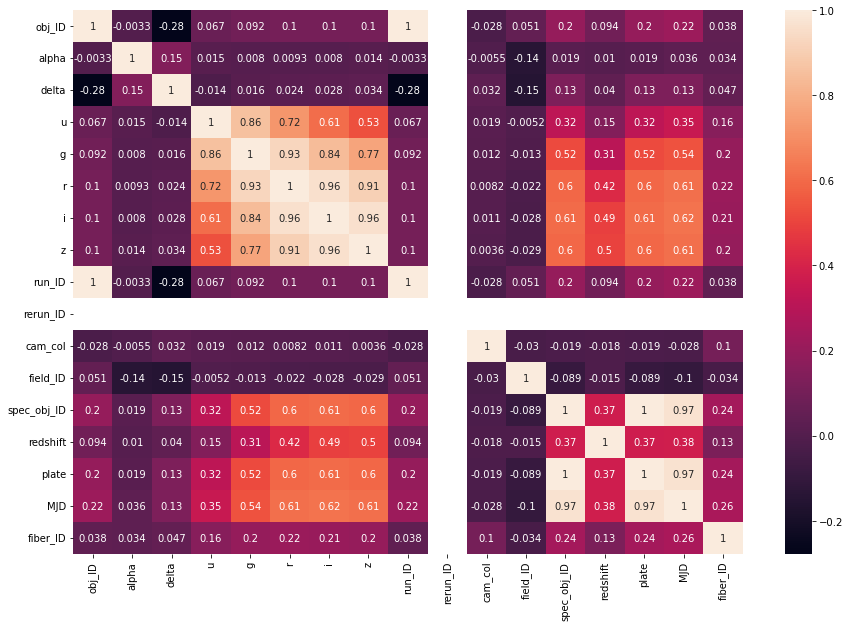

In [7]:
f, ax = plt.subplots(figsize=(15, 10))
ax =sns.heatmap(df.corr(),annot=True,)

- from the heatmap above we can see that rerun_id is a column that we might want to get rid of
- this fact is also supported by the fact in the earlier df.describe the rerun_ID only consisted the value of 301
- so we know we cannot learn anything from this
- we can also not that obj_ID has the exact same corrolations as run_ID we can see this with the corrolation between obj_ID and run_ID
- so we can drop it one of them

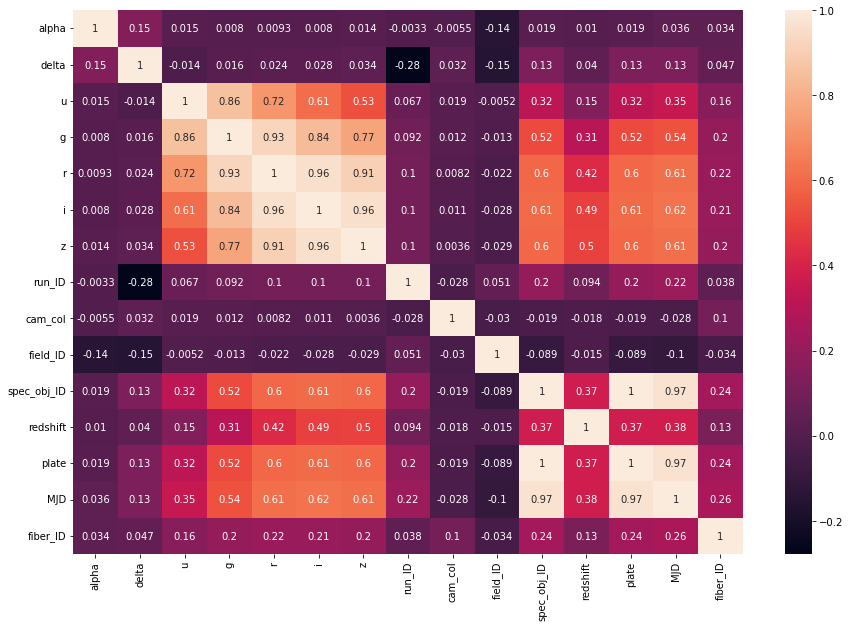

In [8]:
df.drop(columns=['rerun_ID', 'obj_ID'],inplace=True)
f, ax = plt.subplots(figsize=(15, 10))
ax =sns.heatmap(df.corr(),annot=True,)

## Standardization and outlier removal

In [9]:
df.describe()

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3.750000e+03,3750.000000,3750.000000,3750.000000,3750.000000
mean,176.855337,25.056108,21.785728,20.503215,19.732344,19.285847,19.028573,4445.062933,3.540533,179.717867,6.111389e+18,0.708439,5427.890933,55776.894933,460.458400
std,96.456471,19.775248,2.164203,1.975303,1.863025,1.817341,1.835299,1964.169979,1.593811,145.333727,3.374362e+18,0.897576,2997.019471,1778.599927,275.404993
min,0.010959,-17.226267,14.263810,12.035990,11.641660,11.515270,12.551280,109.000000,1.000000,11.000000,2.996123e+17,-0.001516,266.000000,51630.000000,1.000000
25%,125.032070,6.568098,20.227078,19.058940,18.398768,18.018442,17.755903,3180.000000,2.000000,78.000000,3.221239e+18,0.000069,2861.000000,54567.000000,234.000000
50%,179.967953,25.952730,21.788910,20.960845,20.222475,19.642665,19.280090,4152.000000,4.000000,141.000000,5.845294e+18,0.428319,5191.500000,55983.000000,441.000000
75%,235.475490,40.995513,23.252765,21.875635,21.154430,20.700325,20.432520,5362.000000,5.000000,232.000000,8.733514e+18,1.139619,7756.750000,57279.000000,672.000000
max,359.999810,77.928405,30.660390,30.607000,29.374110,30.250090,26.296900,8162.000000,6.000000,980.000000,1.412464e+19,6.748448,12545.000000,58932.000000,1000.000000


- Looking at the mean and std values in table above we can see that we need to standardize the data in order to improve the learning. Cause if we don't it will have a major affect on the learning of out models

In [10]:
df_class = df['class']
df.drop(columns ='class',inplace=True)
df=(df-df.mean())/df.std()
df['class'] = df_class
df.describe()

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03,3.750000e+03
mean,1.653241e-15,-4.001458e-15,4.027753e-14,9.931670e-15,1.045664e-14,1.638695e-14,-1.441330e-14,-2.116529e-16,-8.975931e-16,-7.188324e-17,-5.710099e-15,4.440004e-16,7.049176e-17,-1.865826e-15,6.199485e-17
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.833411e+00,-2.138146e+00,-3.475607e+00,-4.286544e+00,-4.342768e+00,-4.275794e+00,-3.529284e+00,-2.207580e+00,-1.593999e+00,-1.160900e+00,-1.722333e+00,-7.909704e-01,-1.722341e+00,-2.331550e+00,-1.668301e+00
25%,-5.372710e-01,-9.349066e-01,-7.201963e-01,-7.311664e-01,-7.158128e-01,-6.973948e-01,-6.934401e-01,-6.440700e-01,-9.665720e-01,-6.998917e-01,-8.565023e-01,-7.892038e-01,-8.564812e-01,-6.802513e-01,-8.222741e-01
50%,3.226965e-02,4.534060e-02,1.470193e-03,2.316756e-01,2.630832e-01,1.963407e-01,1.370444e-01,-1.492045e-01,2.882817e-01,-2.664066e-01,-7.885784e-02,-3.120851e-01,-7.887534e-02,1.158805e-01,-7.065377e-02
75%,6.077369e-01,8.060281e-01,6.778648e-01,6.947892e-01,7.633208e-01,7.783227e-01,7.649693e-01,4.668318e-01,9.157086e-01,3.597385e-01,7.770729e-01,4.803827e-01,7.770584e-01,8.445435e-01,7.681110e-01
max,1.898727e+00,2.673660e+00,4.100661e+00,5.115055e+00,5.175329e+00,6.033122e+00,3.960296e+00,1.892370e+00,1.543135e+00,5.506514e+00,2.374744e+00,6.729248e+00,2.374729e+00,1.773926e+00,1.959084e+00


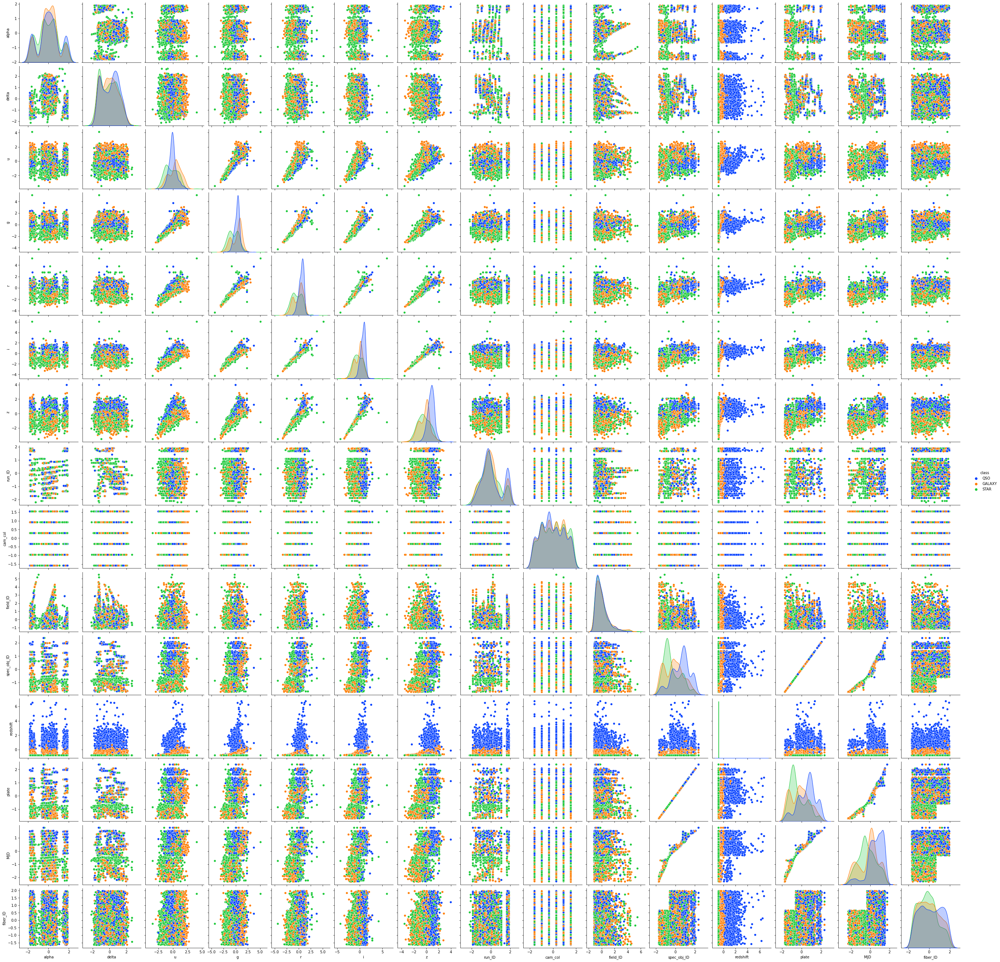

In [11]:
sns.pairplot(df,hue='class',palette= 'bright') # this took 2 min to run i would not recomend running it unless you are willing to wait

- from the above we can see that there are a few outliers so we need to remove them

C:\Users\User\AppData\Local\Temp/ipykernel_14124/3555360803.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['class'] = df_class


Counter({'STAR': 1216, 'GALAXY': 1205, 'QSO': 1202})


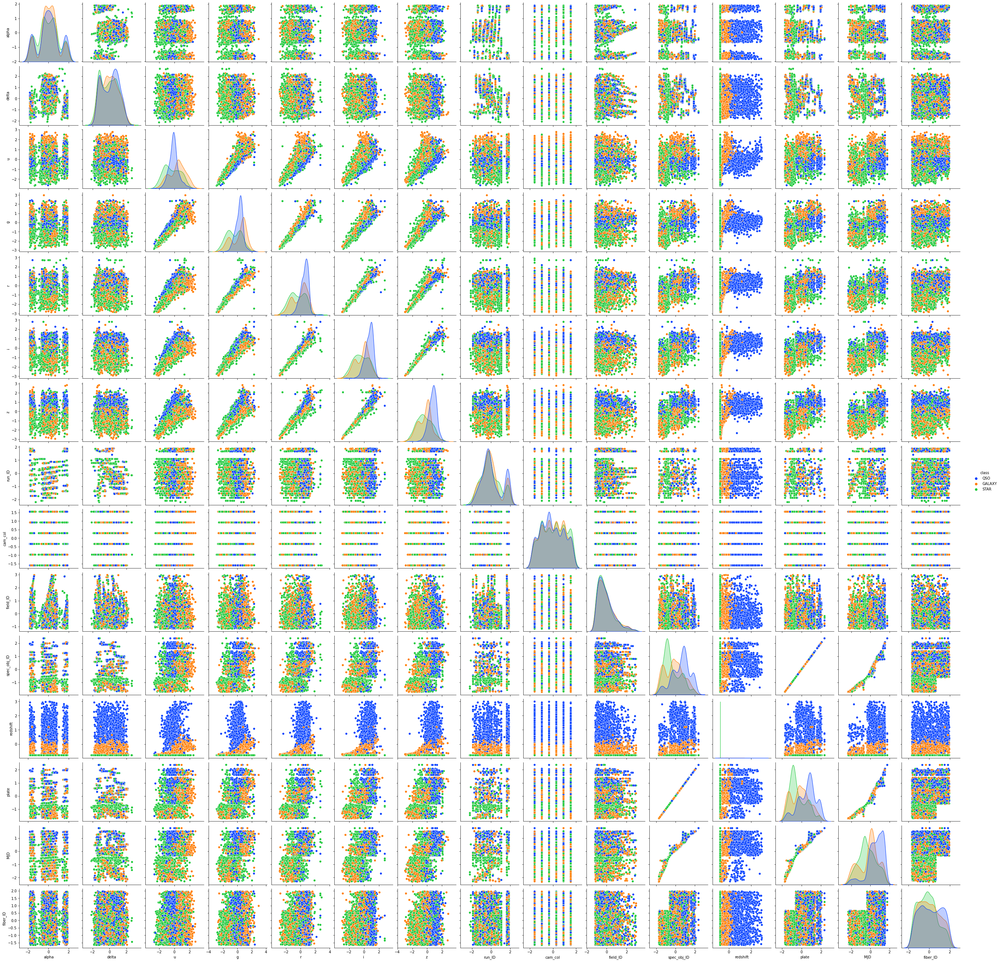

In [12]:
#outlier removal
df.drop(columns ='class',inplace=True)
df=df[(np.abs(stats.zscore(df)) < 3).all(axis=1)] # this where the magic happens for removing outliers
df['class'] = df_class
print(Counter(df['class']))
sns.pairplot(df,hue='class',palette= 'bright')

<AxesSubplot:xlabel='class', ylabel='count'>

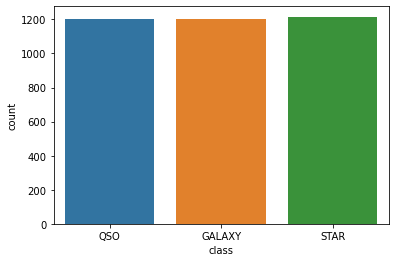

In [13]:
sns.countplot(data = df, x ='class')

### Split data into traing and test and seperate labels and atrributes
- labels were not numeric so labels were encoded using a label encoder from sklearn
- matrix dimention clarrification:
    - X_train = (num_feature, num_instances) (relative to the train data)
    - y_train = (num_of_unique_labels, num_instances) (relative to the train data and after label_to_vector has been run)
    - X_test = (num_feature, num_instances) (relative to the test data)
    - y_test = (num_of_unique_labels, num_instances) (relative to the test data and after label_to_vector has been run)

In [14]:
seperation_value = int(len(df)*0.7)
# data handling
df_train = df.iloc[:seperation_value,:] #train data will be the first 70 persent of the randomized dataset
df_test = df.iloc[seperation_value:,:] # test will bbe the remaining 30 persent of the randomized dataset
print(len(df_train))
print(len(df_test))
num_classes = 3

# create numpy matrices

X_train = np.transpose(df_train.drop(columns='class', axis=1).to_numpy())
print(X_train.shape)
X_test = np.transpose(df_test.drop(columns='class', axis=1).to_numpy())
print(X_test.shape)

label_encoder = preprocessing.LabelEncoder()

y_train_label = label_encoder.fit_transform((np.transpose(df_train['class'].to_numpy())))
print(y_train_label)
y_test_label = label_encoder.fit_transform((np.transpose(df_test['class'].to_numpy())))
y_train = label_to_vector(y_train_label, num_classes)
y_test = label_to_vector(y_test_label, num_classes)
print(y_train.shape)
print(y_test.shape)

2536
1087
(15, 2536)
(15, 1087)
[1 0 2 ... 0 1 1]
(3, 2536)
(3, 1087)


Activation Function: Sigmoid
....................................................................................................
final cost:  0.43199804918596335
training set percentage accuracy =  93.0993690851735 %
test set percentage accuracy =  93.7442502299908 %


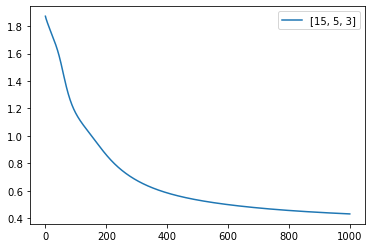

In [15]:
print("Activation Function: Sigmoid")
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

....................................................................................................
final cost:  0.38660884879380053
training set percentage accuracy =  91.91640378548895 %
test set percentage accuracy =  93.28426862925483 %


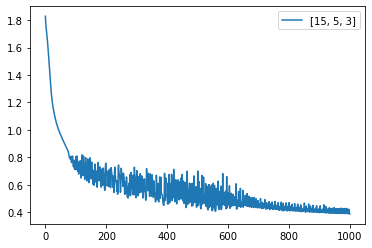

In [16]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, ReLU, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, ReLU, costs)
relu_cost = costs[-1]

- when using the ReLU some strange behaviour orrurs 
- This is probably due to the learning rate value and lamba values
- uppon further investigation performing some hyperparamiter optimization and slightly chaneing the learning rate and lambda value the problem became less of an issue 

....................................................................................................
final cost:  0.4949723138143435
training set percentage accuracy =  92.62618296529969 %
test set percentage accuracy =  93.00827966881324 %


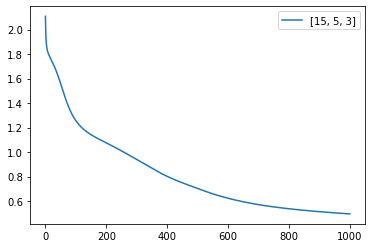

In [17]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.1
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, ReLU, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, ReLU, costs)
relu_cost = costs[-1]

....................................................................................................
final cost:  0.46603590669808564
training set percentage accuracy =  89.74763406940063 %
test set percentage accuracy =  90.7083716651334 %


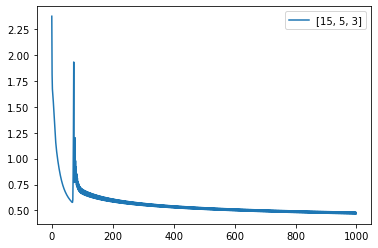

In [18]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, linear, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, linear, costs)
relu_cost = costs[-1]

- like with the Relu there was a slight issue with the behavior
- and some hyperparameterisation solved this issue again

....................................................................................................
final cost:  0.47626612637390675
training set percentage accuracy =  92.66561514195584 %
test set percentage accuracy =  93.56025758969642 %


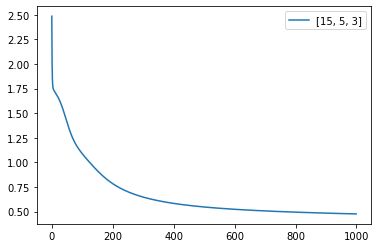

In [19]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.1
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, linear, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, linear, costs)
relu_cost = costs[-1]

....................................................................................................
final cost:  0.3327991918961777
training set percentage accuracy =  94.67665615141956 %
test set percentage accuracy =  94.84820607175713 %


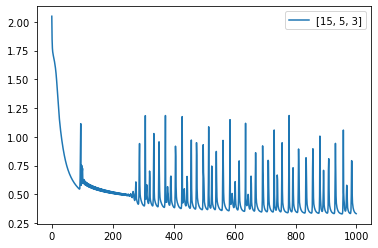

In [20]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, tanh, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, tanh, costs)
relu_cost = costs[-1]

- again strange behavour
- and again hyperparameters need to be optimized

....................................................................................................
final cost:  0.42487104485119215
training set percentage accuracy =  93.0205047318612 %
test set percentage accuracy =  93.83624655013799 %


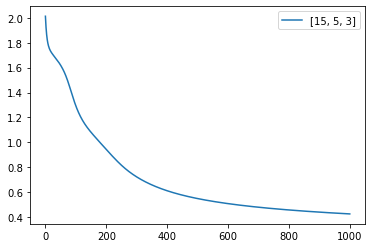

In [21]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.1
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train, y_train, tanh, epochs, alpha, lambd)
acc_train_relu, acc_test_relu = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, tanh, costs)
relu_cost = costs[-1]

#### Trying sigmoid again with new adjusted hyperparameters similar to the previously improved hyper parameters of the other functions

....................................................................................................
final cost:  0.9043939706957514
training set percentage accuracy =  82.72870662460568 %
test set percentage accuracy =  83.44066237350506 %


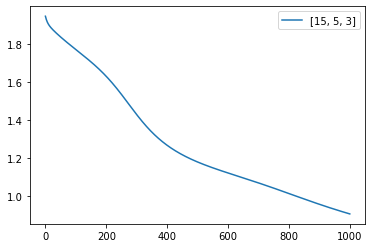

In [22]:
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.1
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- using the sigmoid activation function with hyperparameters similar to the improved hyper parameters of the other activations decreased the accuracy

#### Notes and conclustion on using different activation functions
- when using different activation functions hyperparameterisation need to be re-done in order to achive the best results
- clearly activation functions are somewhat dependent on their hyperparameters in a nueral network

## Using different network architectures
- from the previous experiment on using different activation functions. I don't think it matters which activation function will be used as the accuracies were very similar (if HP is optimized)
- for consitancie we will use the sigmoid activation  

Using diffferent number of neruons in a single hidden layer

Activation Function: Sigmoid
....................................................................................................
final cost:  0.43230495856584455
training set percentage accuracy =  93.37539432176656 %
test set percentage accuracy =  93.83624655013799 %


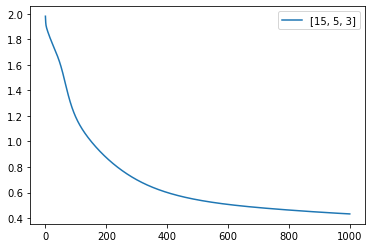

In [23]:
print("Activation Function: Sigmoid")
NN_architecture = [15, 5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

Activation Function: Sigmoid
-------------------------------------------------------------------------------
using 10 neurons in the hidden layer
....................................................................................................
final cost:  0.41568280627604726
training set percentage accuracy =  93.29652996845425 %
test set percentage accuracy =  94.11223551057958 %
-------------------------------------------------------------------------------
using 20 neurons on the single hidden layer
....................................................................................................
final cost:  0.4035642596411806
training set percentage accuracy =  93.76971608832808 %
test set percentage accuracy =  94.57221711131555 %


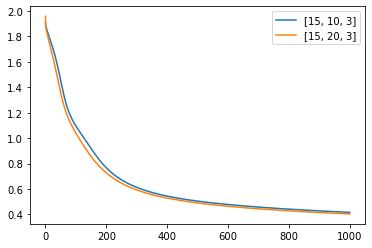

In [24]:
print("Activation Function: Sigmoid")
print("-------------------------------------------------------------------------------")
print("using 10 neurons in the hidden layer")
NN_architecture = [15, 10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 20 neurons on the single hidden layer")
NN_architecture = [15, 20, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- Looking at the graph above the scale at which you increase the number of neurons does not really make a difference to the results
- increasing the number of neurons did not really improve the accuracy from the original structure in the previous section only a slight improvement when using 20 neurons

Using 2 layers with 5 neurons each and then increasing the neurons in each layer

Activation Function: Sigmoid
-------------------------------------------------------------------------------
using 2 hidden layers with 5 neurons each hidden layer
....................................................................................................
final cost:  0.5376563814796782
training set percentage accuracy =  91.7981072555205 %
test set percentage accuracy =  93.10027598896045 %
-------------------------------------------------------------------------------
using 2 hidden layers with 10 neurons each hidden layer
....................................................................................................
final cost:  0.5399534385257221
training set percentage accuracy =  88.05205047318611 %
test set percentage accuracy =  89.0524379024839 %
-------------------------------------------------------------------------------
using 2 hidden layers with 20 neurons each hidden layer
....................................................................................

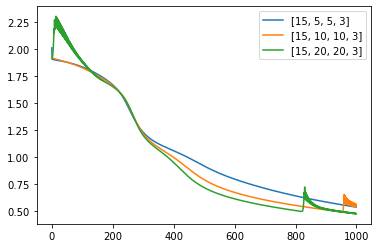

In [25]:
print("Activation Function: Sigmoid")
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 5 neurons each hidden layer")
NN_architecture = [15, 5,5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 10 neurons each hidden layer")
NN_architecture = [15, 10,10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 20 neurons each hidden layer")
NN_architecture = [15, 20,20, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- using two layers decreased my test accuracy as a whole
- but there is also some strange behavior when 2 layers with 20 neurons each is used
- adjusting the hyper parameters will fix this
- to further improve the accuracy we set the number of epochs to 3000 

Activation Function: Sigmoid
-------------------------------------------------------------------------------
using 2 hidden layers with 5 neurons each hidden layer
....................................................................................................
final cost:  0.4039194548515457
training set percentage accuracy =  93.41482649842271 %
test set percentage accuracy =  94.66421343146274 %
-------------------------------------------------------------------------------
using 2 hidden layers with 10 neurons each hidden layer
....................................................................................................
final cost:  0.37665755762861575
training set percentage accuracy =  94.6372239747634 %
test set percentage accuracy =  94.38822447102115 %
-------------------------------------------------------------------------------
using 2 hidden layers with 20 neurons each hidden layer
..................................................................................

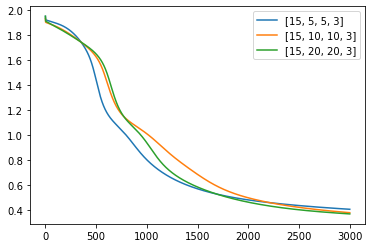

In [26]:
# channing the hyper values
print("Activation Function: Sigmoid")
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 5 neurons each hidden layer")
NN_architecture = [15, 5,5, 3]
epochs = 3000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 10 neurons each hidden layer")
NN_architecture = [15, 10,10, 3]
epochs = 3000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers with 20 neurons each hidden layer")
NN_architecture = [15, 20,20, 3]
epochs = 3000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- using 2 hiddenlayers with running more epochs has imporoved the resulst

Using three layers and increasing the number of neurons

Activation Function: Sigmoid
-------------------------------------------------------------------------------
using 3 hidden layers and 5 neurons in each hidden layer
....................................................................................................
final cost:  0.8416877493449632
training set percentage accuracy =  87.73659305993691 %
test set percentage accuracy =  90.06439742410303 %
-------------------------------------------------------------------------------
using 3 hidden layers and 10 neurons in each hidden layer
....................................................................................................
final cost:  0.7736074629269138
training set percentage accuracy =  88.68296529968454 %
test set percentage accuracy =  91.26034958601656 %
-------------------------------------------------------------------------------
using 3 hidden layers and 20 neurons in each hidden layer
............................................................................

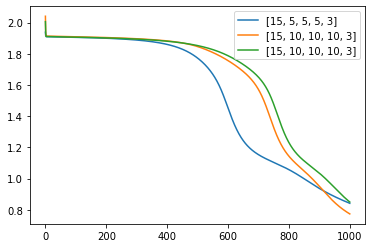

In [27]:
print("Activation Function: Sigmoid")
print("-------------------------------------------------------------------------------")
print("using 3 hidden layers and 5 neurons in each hidden layer")
NN_architecture = [15, 5,5,5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 3 hidden layers and 10 neurons in each hidden layer")
NN_architecture = [15, 10,10,10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 3 hidden layers and 20 neurons in each hidden layer")
NN_architecture = [15, 10,10,10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- three layers drastically decreased my results and increasing the number of neurons in each layer also had somewhat of a negative effect

Using 2 higgen layers with each hidden layer having a different number of neurons

Activation Function: Sigmoid
-------------------------------------------------------------------------------
using 2 hidden layers where hidden layer 1 has 5 neurons and hidden layer 2 has 10 neurons
....................................................................................................
final cost:  0.5566776172701633
training set percentage accuracy =  91.12776025236593 %
test set percentage accuracy =  90.6163753449862 %
-------------------------------------------------------------------------------
using 2 hidden layers where hidden layer 1 has 10 neurons and hidden layer 2 has 5 neurons
....................................................................................................
final cost:  0.5225372239215664
training set percentage accuracy =  91.67981072555204 %
test set percentage accuracy =  91.35234590616376 %
-------------------------------------------------------------------------------
using 2 hidden layers where hidden layer 1 has 10 neurons and hidden

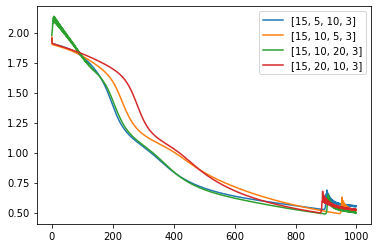

In [28]:
print("Activation Function: Sigmoid")
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where hidden layer 1 has 5 neurons and hidden layer 2 has 10 neurons")
NN_architecture = [15, 5,10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where hidden layer 1 has 10 neurons and hidden layer 2 has 5 neurons")
NN_architecture = [15, 10,5, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where hidden layer 1 has 10 neurons and hidden layer 2 has 20 neurons")
NN_architecture = [15, 10,20, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where hidden layer 1 has 20 neurons and hidden layer 2 has 10 neurons")
NN_architecture = [15, 20,10, 3]
epochs = 1000
alpha = 0.5
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- result remain similar to when 2 layers are used and each hidden layer has the same number of neurons

Using 2 hidden players with optimized hyperparameters but increased the number of epochs

using 2 hidden layers where the hidden layers have 5 neurons each
....................................................................................................
final cost:  0.32901829267627375
training set percentage accuracy =  94.79495268138801 %
test set percentage accuracy =  95.3081876724931 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 10 neurons each
....................................................................................................
final cost:  0.31107467870572664
training set percentage accuracy =  95.66246056782335 %
test set percentage accuracy =  95.67617295308187 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 10 neurons each
....................................................................................................
final cost:  0.2747869954562907
training set percentage 

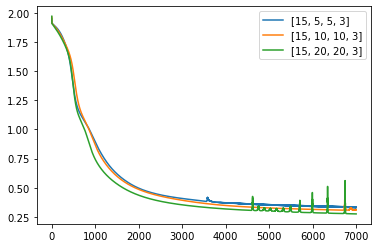

In [29]:
print("using 2 hidden layers where the hidden layers have 5 neurons each")
NN_architecture = [15, 5,5, 3]
epochs = 7000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 10 neurons each")
NN_architecture = [15, 10,10, 3]
epochs = 7000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 10 neurons each")
NN_architecture = [15, 20,20, 3]
epochs = 7000
alpha = 0.25
lambd = 0.0001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, sigmoid, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, sigmoid, costs)
sigmoid_cost = costs[-1]

- we can see that increasing the number of epochs has a positive impact on the results when increasing the number of hidden layers and neurons

## Using different activation functions 2 Hidden layers and a larger number of epochs

Activation function: ReLU
using 2 hidden layers where the hidden layers have 5 neurons each
....................................................................................................
final cost:  0.6552315033854359
training set percentage accuracy =  92.19242902208202 %
test set percentage accuracy =  93.10027598896045 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 10 neurons each
....................................................................................................
final cost:  0.6441040414570143
training set percentage accuracy =  93.76971608832808 %
test set percentage accuracy =  93.7442502299908 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 20 neurons each
....................................................................................................
final cost:  0.6216581446172498


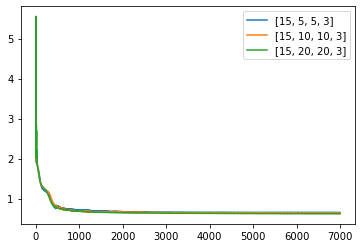

In [30]:
a_func = ReLU
print("Activation function: ReLU")
print("using 2 hidden layers where the hidden layers have 5 neurons each")
NN_architecture = [15, 5,5, 3]
epochs = 7000
alpha = 0.1
lambd = 0.01
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 10 neurons each")
NN_architecture = [15, 10,10, 3]
epochs = 7000
alpha = 0.1
lambd = 0.01
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 20 neurons each")
NN_architecture = [15, 20,20, 3]
epochs = 7000
alpha = 0.1
lambd = 0.01
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]

Activation function: tanh
using 2 hidden layers where the hidden layers have 5 neurons each
....................................................................................................
final cost:  0.3327127205446321
training set percentage accuracy =  95.42586750788644 %
test set percentage accuracy =  96.04415823367066 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 10 neurons each
....................................................................................................
final cost:  0.3081739456915864
training set percentage accuracy =  96.21451104100946 %
test set percentage accuracy =  95.95216191352345 %
-------------------------------------------------------------------------------
using 2 hidden layers where the hidden layers have 20 neurons each
....................................................................................................
final cost:  0.2926965317747825

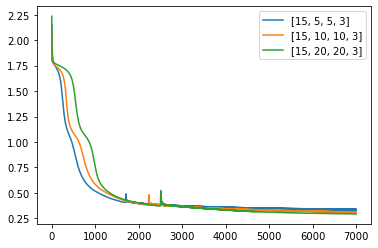

In [31]:
a_func = tanh
print("Activation function: tanh")
print("using 2 hidden layers where the hidden layers have 5 neurons each")
NN_architecture = [15, 5,5, 3]
epochs = 7000
alpha = 0.05
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 10 neurons each")
NN_architecture = [15, 10,10, 3]
epochs = 7000
alpha = 0.05
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]
print("-------------------------------------------------------------------------------")
print("using 2 hidden layers where the hidden layers have 20 neurons each")
NN_architecture = [15, 20,20, 3]
epochs = 7000
alpha = 0.05
lambd = 0.001
Thetas, costs = train_nn(NN_architecture, X_train,y_train, a_func, epochs, alpha, lambd)
acc_train_sigmoid, acc_test_sigmoid = show_results(NN_architecture,X_train, y_train, X_test, y_test, Thetas, a_func, costs)
sigmoid_cost = costs[-1]

## Conclutions and final notes and remarks
- It is clear that different activation functions can lead to changes in results and when using different activation functions, some hyperparameter optimation will be required.
- there is not universal best activation function, one just needs to try a bounch of them to find the best one
- removing outliers and standardizing is important as it could cause poor accuracy and jumps in the cost
- The number of epochs have a direct affect to the accuracy of the model and this is most evident when the number of layers or neurons increases, when increasing the number of neurons or layers one would also increase the number of epochs as well. But if the system can handle it and time is not an issue, using very large epochs will have the best results (asssuming hyperparameters have been optimized).
- reason epochs has a direct effect is because the more epochs get run the more accurate the error gets distributed to every neuron